In [1]:
library(NeuronChat)
library(CellChat)

Loading required package: dplyr


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


Loading required package: ggplot2

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (stat

In [2]:
# load example data: cortex data from Yao 2021, processed
data(list='cortex_data')
# subset the data by choosing the region VISp
region_name <- 'VISp'; cell_class <- names(table(meta$class_label))
cell_idx <- which(meta$region_label %in% region_name & meta$class_label %in% cell_class & !(meta$subclass_label %in%c('Car3','CR','DG','L2/3 IT PPP','L5/6 IT TPE-ENT')))
target_df_single  <- target_df[cell_idx,] # a data frame: row  cell, column gene (the last column is the cell subclass)
meta_tmp <- meta[cell_idx,];rownames(meta_tmp) <- meta_tmp$sample_name # subset meta
df_group <- meta_tmp[!duplicated(meta_tmp$subclass_label),c('class_label','subclass_label')]
group <- structure(df_group$class_label,names=df_group$subclass_label) # create the cell class for the subclasses, used for plot 

# creat NeuronChat object; choose the database 'mouse' for mouse data; 'human' for human data
# note that the first parameter should be a numeric matrix with row gene and column cell
x <- createNeuronChat(t(as.matrix(target_df_single[,1:(dim(target_df_single)[2]-1)])),DB='mouse',group.by = target_df_single$cell_subclass);
#> Create a NeuronChat object from a data matrix

Create a NeuronChat object from a data matrix



In [3]:
# mean_method=NULL

In [5]:
# M is for the permutation test; typically ~4 mins when M=100, depending on the dataset size and the number of cell groups
# setting M=10 to get a quick start
x <- run_NeuronChat(x,M=10)
#> Time difference of 5.181635 mins
# the the communication networks for individual interaction pairs are stored in slot 'net'
# aggregate the communication networks over all interaction pairs, method can be 'weight', 'count' and so on
net_aggregated_x <- net_aggregation(x@net,method = 'weight')

Time difference of 50.26223 secs


In [6]:
# # par(mfrow=c(1,2))
# # Visualization, circle plot, for the aggregated network
# netVisual_circle_neuron(net_aggregated_x,group=group,vertex.label.cex = 1)
# # Visualization, chordDiagram, for the aggregated network; also using cellchat function netVisual_chord_cell_internal(net_aggregated_x, group = group,lab.cex=1)
# netVisual_chord_neuron(x,method = 'weight',group=group,lab.cex = 1)

In [7]:
# x<- identifyCommunicationPatterns_Neuron(x, slot.name = "net", pattern = c("outgoing"), k=4,height = 18)

In [8]:
library(ggalluvial)
# netAnalysis_river_Neuron(x,slot.name = "net", pattern = c("outgoing"),font.size = 2.5,cutoff.1 = 0.5,cutoff.2=0.5)

In [25]:
MY_identifyCommunicationPatterns_Neuron <- function(object, slot.name = "net", pattern = c("outgoing","incoming"), k = NULL, k.range = seq(2,10), heatmap.show = TRUE,
                                                 color.use = NULL, color.heatmap = "Spectral", title.legend = "Contributions",
                                                 width = 4, height = 6, font.size = 8,thresh_quantile=0, NMF_method='lee', seed_method='nndsvd') {
  # heatmap.show = TRUE;color.use = NULL;color.heatmap = "Spectral";title.legend = "Contributions";
  # width = 4; height = 6; font.size = 8
  pattern <- match.arg(pattern)
  prob <- simplify2array(methods::slot(object, slot.name))
  if (pattern == "outgoing") {
    data_sender <- apply(prob, c(1,3), sum)
    data_sender = sweep(data_sender, 2L, apply(data_sender, 2, function(x) max(c(x,1e-6), na.rm = TRUE)), '/', check.margin = FALSE)
    data0 = as.matrix(data_sender)
  } else if (pattern == "incoming") {
    data_receiver <- apply(prob, c(2,3), sum)
    data_receiver = sweep(data_receiver, 2L, apply(data_receiver, 2, function(x) max(c(x,1e-6), na.rm = TRUE)), '/', check.margin = FALSE)
    data0 = as.matrix(data_receiver)
  }
  options(warn = -1)
  data <- data0
  data <- data[rowSums(data)!=0,colSums(data)!=0]
  data <- data[,colSums(data) >= quantile(colSums(data),thresh_quantile)]
  data <- data[rowSums(data)!=0,]

  outs_NMF <- NMF::nmf(data, rank = k, method = NMF_method, seed = seed_method)    ######### use brunett or lee for NMF methods########################
  W <- scaleMat(outs_NMF@fit@W, 'r1')
  H <- scaleMat(outs_NMF@fit@H, 'c1')
  colnames(W) <- paste0("Pattern ", seq(1,ncol(W))); rownames(H) <- paste0("Pattern ", seq(1,nrow(H)));
  

  data_W <- as.data.frame(as.table(W)); colnames(data_W) <- c("CellGroup","Pattern","Contribution")
  data_H <- as.data.frame(as.table(H)); colnames(data_H) <- c("Pattern","Signaling","Contribution")

  res.pattern = list("cell" = data_W, "signaling" = data_H)
  methods::slot(object, 'net_analysis')$pattern[[pattern]] <- list(data = data0, pattern = res.pattern)
  return(object)
}

In [16]:
MY_netAnalysis_river_Neuron <- function(object, slot.name = "net", pattern = c("outgoing","incoming"), cutoff.1 = 0.25, cutoff.2 = 0.5,top.n1=1e4,top.n2=1e4,
                                 sources.use = NULL, targets.use = NULL, signaling = NULL,
                                 color.use = NULL, color.use.pattern = NULL, color.use.signaling = "grey50",
                                 do.order = TRUE, main.title = NULL,
                                 font.size = 2.5, font.size.title = 12){
    
    requireNamespace("ggalluvial")
    res.pattern <- methods::slot(object, 'net_analysis')$pattern[[pattern]]
    data1 = res.pattern$pattern$cell
    data2 = res.pattern$pattern$signaling


    data1$Contribution[data1$Contribution <= sort(data1$Contribution,decreasing = T)[min(dim(data1)[1],top.n1)]] <- 0
    data1$Contribution[data1$Contribution < cutoff.1] <- 0
    plot.data <- data1
    
    nPatterns<-length(unique(plot.data$Pattern))
    nCellGroup<-length(unique(plot.data$CellGroup))
    cells.level = levels(object@idents)
    
    if (is.null(color.use)) {
        color.use <- CellChat::scPalette(length(cells.level))[cells.level %in% unique(plot.data$CellGroup)]
    }
    if (is.null(color.use.pattern)){
        color.use.pattern <- ggPalette(nPatterns)
    }
    if (!is.null(sources.use)) {
        if (is.numeric(sources.use)) {
            sources.use <- cells.level[sources.use]
        }
        plot.data <- subset(plot.data, CellGroup %in% sources.use)
    }
    if (!is.null(targets.use)) {
        if (is.numeric(targets.use)) {
            targets.use <- cells.level[targets.use]
        }
        plot.data <- subset(plot.data, CellGroup %in% targets.use)
    }
    
    ## connect cell groups with patterns--------------------------------------------------------------------------------------------------
    plot.data.long <- to_lodes_form(plot.data, axes = 1:2, id = "connection")

    if (do.order) {
        mat = tapply(plot.data[["Contribution"]], list(plot.data[["CellGroup"]], plot.data[["Pattern"]]), sum)
        d <- dist(as.matrix(mat))
        hc <- hclust(d, "ave")
        k <- length(unique(grep("Pattern", plot.data.long$stratum[plot.data.long$Contribution != 0], value = T)))
        cluster <- hc %>% cutree(k)
        order.name <- order(cluster, decreasing = TRUE)
        plot.data.long$stratum <- factor(plot.data.long$stratum, levels = c(names(cluster)[order.name], colnames(mat)))
        color.use <- color.use[order.name]
    }
    
    color.use.all <- c(color.use, color.use.pattern)
    StatStratum <- ggalluvial::StatStratum
    gg1 <- ggplot(plot.data.long,aes(x = factor(x, levels = c("CellGroup", "Pattern")),y=Contribution,
                                        stratum = stratum, alluvium = connection,
                                        fill = stratum, label = stratum)) +
        geom_flow(width = 1/3,aes.flow = "backward") +
        geom_stratum(width=1/3,size=0.1,color="black", alpha = 0.8, linetype = 1) +
        geom_text(stat = "stratum", size = font.size) +
        scale_x_discrete(limits = c(),  labels=c("Cell groups", "Patterns")) +
        scale_fill_manual(values = alpha(color.use.all, alpha = 0.8), drop = FALSE) +
        theme_bw()+
        theme(legend.position = "none",
              axis.title = element_blank(),
              axis.text.y= element_blank(),
              panel.grid.major = element_blank(),
              panel.grid.minor  = element_blank(),
              panel.border = element_blank(),
              axis.ticks = element_blank(),axis.text=element_text(size=10)) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm"))
    
    ## connect patterns with signaling----------------------------------------------------------------------------------------------------
    data2$Contribution[data2$Contribution <= sort(data2$Contribution,decreasing = T)[min(dim(data2)[1],top.n2)]] <- 0
    data2$Contribution[data2$Contribution < cutoff.2] <- 0
    plot.data <- data2
    nPatterns<-length(unique(plot.data$Pattern))
    nSignaling<-length(unique(plot.data$Signaling))
    if (length(color.use.signaling) == 1) {
    color.use.all <- c(color.use.pattern, rep(color.use.signaling, nSignaling))
    } else {
    color.use.all <- c(color.use.pattern, color.use.signaling)
    }
    if (!is.null(signaling)) {
    plot.data <- plot.data[plot.data$Signaling %in% signaling, ]
    }
    
    plot.data.long <- ggalluvial::to_lodes_form(plot.data, axes = 1:2, id = "connection")

    if (do.order) {
        mat = tapply(plot.data[["Contribution"]], list(plot.data[["Signaling"]], plot.data[["Pattern"]]), sum)
        mat[is.na(mat)] <- 0; mat <- mat[-which(rowSums(mat) == 0), ]
        d <- dist(as.matrix(mat))
        hc <- hclust(d, "ave")
        k <- length(unique(grep("Pattern", plot.data.long$stratum[plot.data.long$Contribution != 0], value = T)))
        cluster <- hc %>% cutree(k)
        order.name <- order(cluster)
        plot.data.long$stratum <- factor(plot.data.long$stratum, levels = c(colnames(mat),names(cluster)[order.name]))

    }
    
    gg2 <- ggplot(plot.data.long,aes(x = factor(x, levels = c("Pattern", "Signaling")), y= Contribution,
                                    stratum = stratum, alluvium = connection,
                                    fill = stratum, label = stratum)) +
    geom_flow(width = 1/3,aes.flow = "forward") +
    geom_stratum(width=1/3,size=0.1,color="black", alpha = 0.8, linetype = 1) +

    geom_text(stat = "stratum", size = font.size) + # 2.5
    scale_x_discrete(limits = c(),  labels=c("Patterns", "Signaling")) +
    scale_fill_manual(values = alpha(color.use.all, alpha = 0.8), drop = FALSE) +
    theme_bw()+
    theme(legend.position = "none",
          axis.title = element_blank(),
          axis.text.y= element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor  = element_blank(),
          panel.border = element_blank(),
          axis.ticks = element_blank(),axis.text=element_text(size= 10))+
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm"))
    
    
    gg <- cowplot::plot_grid(gg1, gg2, align = "h", nrow = 1)
    title <- cowplot::ggdraw() + cowplot::draw_label(main.title,size = font.size.title)
    gg <- cowplot::plot_grid(title, gg, ncol=1, rel_heights=c(0.1, 1))


    return(gg)
}

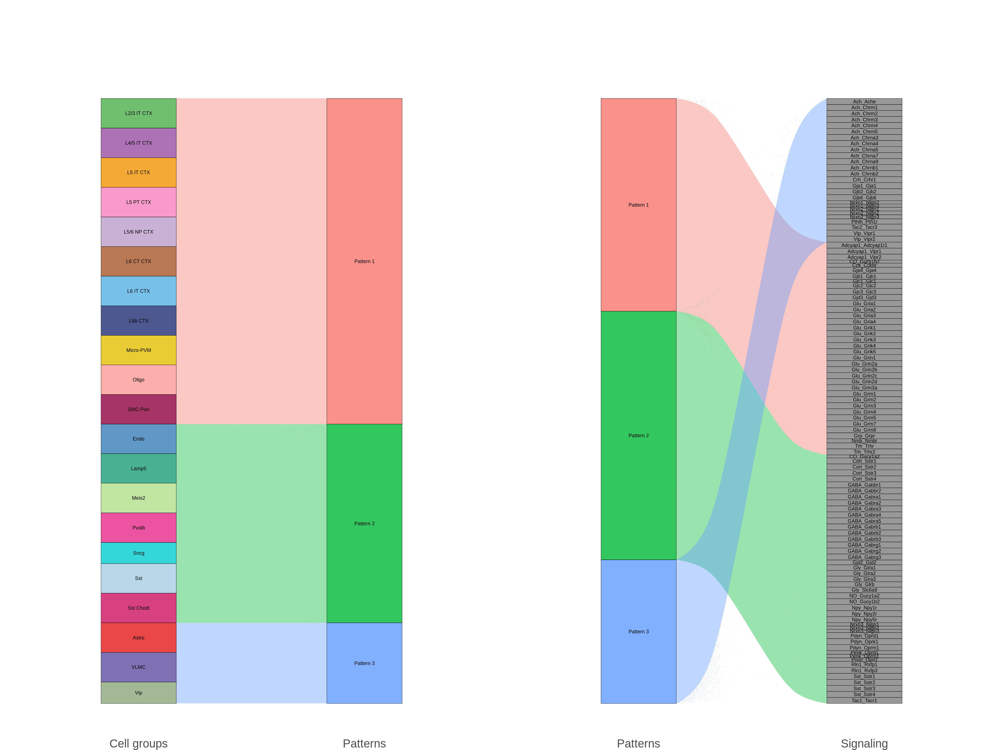

In [24]:
nmfm <- 'brunet'
seedm <- 'nndsvd'
my_x<- MY_identifyCommunicationPatterns_Neuron(x, slot.name = "net", pattern = c("outgoing"), k=3, height = 18, NMF_method=nmfm, seed_method=seedm)
MY_netAnalysis_river_Neuron(my_x,slot.name = "net", pattern = c("outgoing"),font.size = 1.5,cutoff.1 = 0.5,cutoff.2=0.5)


In [18]:
library(Seurat)
# library(SeuratDisk)
library(NMF)
library(ggalluvial)
library(ComplexHeatmap)
library(CellChat)
library(patchwork)
library(graphics)
library(Matrix)
options(stringsAsFactors = FALSE)

library(circlize)
library(colorspace)
options(repr.plot.width = 12, repr.plot.height = 9, repr.plot.res = 300)

library(pracma)
library(glue)
################
## Parameters ##
################
# NMF
#versions that will be made for each combination (resulting in that many figures being made)
versions = seq(from = 1, to = 20, by = 1) 
# NMF methods to be used, can be "brunet" or "lee"...
methods = list("brunet")
# NMF seeding methods to be used, can be "random" or "nndsvd"...
seeds = list("random")
# NMF number of runs to be used, can be 200, 500, 1000, 2000, 5000, 10000...
nrums = list(20)

inhibitory_celltypes <- c("Chandelier", "Lamp5", "Lamp5 Lhx6", "Pax6", "Pvalb", "Sst", "Sst Chodl", "Vip", "Sncg")
inhibitory_celltypes <- inhibitory_celltypes[order(inhibitory_celltypes)]
excitatory_celltypes <- c("L2/3 IT", "L4 IT", "L5", "L5 ET", "L5/6 ET", "L6 CT", "L6 IT", "L6 IT Car3","L5 IT","L5/6 NP","L6b")
excitatory_celltypes <- excitatory_celltypes[order(excitatory_celltypes)]
support_celltypes <- c("Astro","Endo","Micro/PVM", "Oligo", "OPC", "VLMC")
#################

Attaching SeuratObject

Loading required package: registry

Loading required package: rngtools

Loading required package: cluster

NMF - BioConductor layer [OK] | Shared memory capabilities [NO: bigmemory] | Cores 2/2

  To enable shared memory capabilities, try: install.extras('
NMF
')


Attaching package: ‘NMF’


The following objects are masked from ‘package:igraph’:

    algorithm, compare


Loading required package: grid

ComplexHeatmap version 2.15.4
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny a

In [59]:
#my_merged_river
# --------------------------------------------
# Custom merged figured.
# This is what we will use on the file paper
#--------------------------------------------
my_merged_river <- function(object,pattern, disease, inhibitory_celltypes, excitatory_celltypes, support_celltypes){

    if (pattern == "outgoing") {
      main.title = "Outgoing communication patterns of secreting cells"
      # The color palette is defined in the function ggPalette
      # color.use just needs three colors you can define them in a list with hex codes if you want 
      color.use <- ggPalette(3*2)[seq(1,3*2, by = 2)]
      
    } else if (pattern == "incoming") {
      main.title = "Incoming communication patterns of target cells"
      # The color palette is defined in the function ggPalette
      # color.use just needs three colors you can define them in a list with hex codes if you want 
      color.use <- ggPalette(3*2)[seq(2,3*2, by = 2)]
    }

    slot.name = "net"
    res.pattern <- methods::slot(object, slot.name)$pattern[[pattern]]
    # print(res.pattern)

    data1 = res.pattern$pattern$cell
    data2 = res.pattern$pattern$signaling

    # print('-----data1----')
    # print(data1)
    # print('-----data2----')
    # print(data2)

    sorted_group <- data2[order(data2$Signaling, -data2$Contribution),]
    data2 <- sorted_group[!duplicated(sorted_group$Signaling),]

    sorted_group <- data1[order(data1$CellGroup, -data1$Contribution),]
    data1 <- sorted_group[!duplicated(sorted_group$CellGroup),]

    plot.data <- merge(data1,data2,by="Pattern")

    plot.data$Signaling <- as.character(plot.data$Signaling)
    print(unique(plot.data$Signaling))
    plot.data <- plot.data[order(plot.data$Pattern, plot.data$Signaling),]

    # order ligands by pattern
    if(pattern == "outgoing"){
      if(length(outgoing_ligand_order) > 0){
          outgoing_ligand_order_overlap <- intersect(outgoing_ligand_order, unique(plot.data$Signaling))
          #if there is a ligand in plot.data that is not in outgoing_ligand_order, add it to the end of outgoing_ligand_order
          outgoing_ligand_order_overlap <- c(outgoing_ligand_order_overlap, setdiff(unique(plot.data$Signaling), outgoing_ligand_order_overlap))
          print(outgoing_ligand_order_overlap)
          plot.data$Signaling <- factor(plot.data$Signaling, levels = outgoing_ligand_order_overlap) 
          data2$Signaling <- factor(data2$Signaling, levels = outgoing_ligand_order_overlap)
      } 
      else {
        if(disease == "control"){
            outgoing_ligand_order <<- c()
            for (pattern in unique(plot.data$Pattern)){
              #sort the ligands by alphabetical order
              outgoing_ligand_order <<- c(outgoing_ligand_order, unique(plot.data$Signaling[plot.data$Pattern == pattern]))
            }
            plot.data$Signaling <- factor(plot.data$Signaling, levels = outgoing_ligand_order) 
            data2$Signaling <- factor(data2$Signaling, levels = outgoing_ligand_order)
        }
      }
    }
    else if(pattern == "incoming"){
      if(length(incoming_ligand_order) > 0){
          incoming_ligand_order_overlap <- intersect(incoming_ligand_order, unique(plot.data$Signaling))
          incoming_ligand_order_overlap <- c(incoming_ligand_order_overlap, setdiff(unique(plot.data$Signaling), incoming_ligand_order_overlap))
          print(incoming_ligand_order_overlap)
          plot.data$Signaling <- factor(plot.data$Signaling, levels = incoming_ligand_order_overlap) 
          data2$Signaling <- factor(data2$Signaling, levels = incoming_ligand_order_overlap)
      } 
      else {
        if(disease == "control"){
            incoming_ligand_order <<- c()
            for (pattern in unique(plot.data$Pattern)){
              incoming_ligand_order <<- c(incoming_ligand_order, unique(plot.data$Signaling[plot.data$Pattern == pattern]))
            }
            data2$Signaling <- factor(data2$Signaling, levels = incoming_ligand_order)
            plot.data$Signaling <- factor(plot.data$Signaling, levels = incoming_ligand_order) 
        }
      }
    }

    #order cell types by cell type groups
    # inhibitory_celltypes <- c("Chandelier", "Lamp5", "Lamp5 Lhx6", "Pax6", "Pvalb", "Sst", "Sst Chodl", "Vip", "Sncg")
    inhibitory_celltypes <- inhibitory_celltypes[order(inhibitory_celltypes)]
    # excitatory_celltypes <- c("L2/3 IT", "L4 IT", "L5", "L5 ET", "L5/6 ET", "L6 CT", "L6 IT", "L6 IT Car3","L5 IT","L5/6 NP","L6b")
    excitatory_celltypes <- excitatory_celltypes[order(excitatory_celltypes)]
    # support_celltypes <- c("Astro","Endo","Micro/PVM", "Oligo", "OPC", "VLMC")


    celltypesOrder <- c(support_celltypes, inhibitory_celltypes, excitatory_celltypes)
    data1$CellGroup <- factor(data1$CellGroup, levels = celltypesOrder)
    
    # Step 1: Add scaled contribution columns
    #data1$scaledContribution should be contribution / sum of contribution per pattern
    data1$scaledContribution <- ave(data1$Contribution, data1$Pattern, FUN = function(x) x/sum(x))
    #print data1 ordered by Pattern
    print(data1[order(data1$Pattern),])
    data1$scaledContribution <- data1$scaledContribution * 10000
    # Step 2: Replicate rows by the scaled contribution
    data1<- data1[rep(row.names(data1), 
                              times = round(nrow(data1) * data1$scaledContribution)), ]

    data2$scaledContribution <- ave(data2$Contribution, data2$Pattern, FUN = function(x) x/sum(x))
    #print data1 ordered by Pattern
    print(data2[order(data2$Pattern),])
    data2$scaledContribution <- data2$scaledContribution * 10000
    # Step 2: Replicate rows by the scaled contribution
    data2<- data2[rep(row.names(data2), 
                              times = round(nrow(data2) * data2$scaledContribution)), ]

    angles = c(0)
    gg1 <- ggplot(data1,
        aes(axis1 = CellGroup, axis2 = Pattern,y="Contribution")) +
    geom_flow(width = 1/3, aes.flow = "forward", aes(fill = Pattern)) + 
    scale_x_discrete(limits = c("Cell groups", "Pattern")) +
    geom_stratum(alpha = 0.8, aes(fill = Pattern),width = 1/3, size=0.1) + 
    scale_fill_manual(values = color.use) +
    geom_text(angle=angles, size = 4, stat = "stratum", aes(label = after_stat(stratum))) +
    theme_bw()+
        theme(legend.position = "none",
            axis.title = element_blank(),
            axis.text.y= element_blank(),
            panel.grid.major = element_blank(),
            panel.grid.minor  = element_blank(),
            panel.border = element_blank(),
            axis.ticks = element_blank(),axis.text=element_text(size= 10)) + 
            theme(plot.title = element_text(hjust = 0.5))
    


    gg2 <- ggplot(data2,
        aes(axis1 = Pattern, axis2 = Signaling,y="Contribution")) +
    geom_flow(width = 1/3, aes.flow = "forward", aes(fill = Pattern)) + 
    scale_x_discrete(limits = c("Pattern", "Signalling")) +
    geom_stratum(alpha = 0.8, aes(fill = Pattern),width = 1/3, size=0.1) + 
    scale_fill_manual(values = color.use) +
    geom_text(angle=angles, size = 4, stat = "stratum", aes(label = after_stat(stratum))) +
    theme_bw()+
        theme(legend.position = "none",
            axis.title = element_blank(),
            axis.text.y= element_blank(),
            panel.grid.major = element_blank(),
            panel.grid.minor  = element_blank(),
            panel.border = element_blank(),
            axis.ticks = element_blank(),axis.text=element_text(size= 10)) + 
            theme(plot.title = element_text(hjust = 0.5)) 

    # fuse gg1 and gg2 
    gg <- gg1 + gg2
    return(gg)
}


In [78]:
NMF_and_river <- function(cellchat_object, study, disease, inhibitory_celltypes, excitatory_celltypes, support_celltypes, chosen_version, parallel='p16') {
    for (chosen_seed in seeds){
        for (chosen_nrun in nrums){
            for (chosen_method in methods){
                try({
                slot.name = "net"
                pattern = "outgoing"
                object = cellchat_object
                k = 3

                # prob <- methods::slot(object, slot.name)$prob
                
                prob <- simplify2array(methods::slot(object, slot.name))
                # print('printing prob')
                # print(prob)

                data_sender <- apply(prob, c(1,3), sum)
                # print(data_sender)
                # data_sender = sweep(data_sender, 2L, apply(data_sender, 2, function(x) max(x, na.rm = TRUE)), '/', check.margin = FALSE)
                data0 = as.matrix(data_sender)

                options(warn = -1)
                data <- data0
                data <- data[rowSums(data)!=0,]

                
                print(data)
                print("beginning NMF")
                outs_NMF <- NMF::nmf(data, rank = 3, method = chosen_method, seed = chosen_seed, nrun=chosen_nrun, .opt=parallel) 
                W <- scaleMat(outs_NMF@fit@W, 'r1')
                H <- scaleMat(outs_NMF@fit@H, 'c1')
                print("Finished NMF")
                colnames(W) <- paste0("Pattern ", seq(1,ncol(W))); rownames(H) <- paste0("Pattern ", seq(1,nrow(H)));

                data_W <- as.data.frame(as.table(W)); colnames(data_W) <- c("CellGroup","Pattern","Contribution")
                data_H <- as.data.frame(as.table(H)); colnames(data_H) <- c("Pattern","Signaling","Contribution")

                res.pattern = list("cell" = data_W, "signaling" = data_H)
                methods::slot(object, slot.name)$pattern[[pattern]] <- list(data = data0, pattern = res.pattern)

                base_file_name = paste0("outgoing", chosen_nrun, "_runs_", chosen_version, ".pdf")
                rds_name = paste0("outgoing", chosen_nrun, "_runs_", chosen_version, ".rds")
                folder_name = paste(study,disease,sep="/")
                file_name = paste(chosen_method,chosen_seed,base_file_name,sep="_")
                print("creating directory")
                file_dir = paste(folder_name,chosen_method,chosen_seed,sep="/")
                dir.create(file_dir, recursive = TRUE)
                rds_path = paste(folder_name,chosen_method,chosen_seed,rds_name,sep="/")
                file_path = paste(folder_name,chosen_method,chosen_seed,file_name,sep="/")
                # png(filename=file_path)
                colors = c("green","green","green","green","green","green","green","green","green","green","green","green","green")
                my_merged_river(object, pattern = "outgoing", disease, 
                                inhibitory_celltypes=inhibitory_celltypes, 
                                excitatory_celltypes=excitatory_celltypes, 
                                support_celltypes=support_celltypes)

                })
            }
        }
    }
}

In [79]:
incoming_ligand_order <- c()
outgoing_ligand_order <- c()

NMF_and_river(x, "tutorial data", "control", inhibitory_celltypes, excitatory_celltypes, support_celltypes, chosen_version, parallel='p24')

            5HT_Htr1a 5HT_Htr1b 5HT_Htr1d 5HT_Htr1e 5HT_Htr1f 5HT_Htr2a
Astro               0         0         0         0         0         0
Endo                0         0         0         0         0         0
L2/3 IT CTX         0         0         0         0         0         0
L4/5 IT CTX         0         0         0         0         0         0
L5 IT CTX           0         0         0         0         0         0
L5 PT CTX           0         0         0         0         0         0
L5/6 NP CTX         0         0         0         0         0         0
L6 CT CTX           0         0         0         0         0         0
L6 IT CTX           0         0         0         0         0         0
L6b CTX             0         0         0         0         0         0
Lamp5               0         0         0         0         0         0
Meis2               0         0         0         0         0         0
Micro-PVM           0         0         0         0         0   

Timing stopped at: 5.759 0.306 10.47



Error : NMF::nmf - 20/20 fit(s) threw an error.
# Error(s) thrown:
  - run #1: non-conformable arrays


In [34]:
x

An object of class "NeuronChat"
Slot "data.raw":
<0 x 0 matrix>

Slot "data":
          US-1250273_E1_S37 US-1250273_E2_S01 US-1250273_E2_S02
Vip             0.000000000        0.00000000       0.000000000
Vipr1           0.093397122        0.39820649       0.160870743
Ghrh            0.000000000        0.00000000       0.000000000
Adcyap1         0.449677418        1.59513430       1.603546388
Vipr2           0.000000000        0.00000000       0.000000000
Vegfc           0.000000000        0.00785858       0.000000000
          US-1250273_E2_S03 US-1250273_E2_S04 US-1250273_E2_S05
Vip             0.000000000        0.00000000       0.000000000
Vipr1           0.666020555        0.36466303       0.061369606
Ghrh            0.000000000        0.00000000       0.000000000
Adcyap1         0.007856358        1.07646644       0.000000000
Vipr2           0.000000000        0.00000000       0.000000000
Vegfc           0.000000000        0.16834541       0.000000000
          US-1250273_E2_S0

In [36]:
methods::slot(x, 'net')

,Astro,Endo,L2/3 IT CTX,L4/5 IT CTX,L5 IT CTX,L5 PT CTX,L5/6 NP CTX,L6 CT CTX,L6 IT CTX,L6b CTX,⋯,Meis2,Micro-PVM,Oligo,Pvalb,SMC-Peri,Sncg,Sst,Sst Chodl,VLMC,Vip
Astro,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Endo,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
L2/3 IT CTX,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
L4/5 IT CTX,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
L5 IT CTX,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
L5 PT CTX,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
L5/6 NP CTX,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
L6 CT CTX,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
L6 IT CTX,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
L6b CTX,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [43]:
methods::slot(x, 'net')$Ach_Chrm2

,Astro,Endo,L2/3 IT CTX,L4/5 IT CTX,L5 IT CTX,L5 PT CTX,L5/6 NP CTX,L6 CT CTX,L6 IT CTX,L6b CTX,⋯,Meis2,Micro-PVM,Oligo,Pvalb,SMC-Peri,Sncg,Sst,Sst Chodl,VLMC,Vip
Astro,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0
Endo,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0
L2/3 IT CTX,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0
L4/5 IT CTX,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0
L5 IT CTX,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0
L5 PT CTX,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0
L5/6 NP CTX,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0
L6 CT CTX,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0
L6 IT CTX,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0
L6b CTX,0,0,0.000000e+00,0.0000000000,0.000000e+00,0,0.0000000000,0,0.00000e+00,0.000000e+00,⋯,0,0,0,0.000000e+00,0,0,0.000000e+00,0.0000000000,0,0


In [15]:
net_aggregated_x

,Astro,Endo,L2/3 IT CTX,L4/5 IT CTX,L5 IT CTX,L5 PT CTX,L5/6 NP CTX,L6 CT CTX,L6 IT CTX,L6b CTX,⋯,Meis2,Micro-PVM,Oligo,Pvalb,SMC-Peri,Sncg,Sst,Sst Chodl,VLMC,Vip
Astro,0.4604581867,4.013019e-04,1.945760e-01,2.454988e-01,0.1862662545,0.215969309,0.154793386,0.154768407,1.478174e-01,0.1041275179,⋯,7.598505e-06,1.625305e-06,1.000995e-01,0.021058313,0.000000000,2.005755e-02,2.426560e-02,2.332962e-02,3.044799e-01,1.127038e-01
Endo,0.0004720056,2.023315e-02,6.943849e-03,8.476622e-03,0.0056718954,0.005606502,0.004205574,0.005350780,6.073182e-03,0.0055236073,⋯,2.485316e-03,8.884477e-05,5.574382e-05,0.002555564,0.039921490,1.393069e-03,3.505228e-03,2.703749e-03,3.441793e-04,2.794914e-03
L2/3 IT CTX,0.3643094346,0.000000e+00,7.056007e-01,7.881836e-01,0.6255392321,0.678976444,0.599225602,0.586432332,6.180654e-01,0.2768355323,⋯,2.738959e-01,8.615090e-06,4.425180e-02,0.289683152,0.020076519,1.572906e-01,3.784385e-01,1.891911e-01,0.000000e+00,3.112070e-01
L4/5 IT CTX,0.4154558521,0.000000e+00,7.643615e-01,8.698227e-01,0.6956129164,0.738850825,0.667074515,0.648270752,6.706285e-01,0.3582453107,⋯,2.949511e-01,6.339537e-06,1.435887e-01,0.315174408,0.018081796,2.188785e-01,4.050856e-01,2.224764e-01,0.000000e+00,4.285805e-01
L5 IT CTX,0.2532876480,0.000000e+00,6.124225e-01,7.657472e-01,0.5477816352,0.562648675,0.548491776,0.546145938,5.608718e-01,0.3441270976,⋯,3.185332e-01,9.110865e-06,4.261052e-02,0.308527301,0.041977361,2.053662e-01,4.261427e-01,3.070086e-01,0.000000e+00,3.392243e-01
L5 PT CTX,0.3180573048,0.000000e+00,5.532236e-01,6.550525e-01,0.5139207014,0.550233233,0.489742707,0.459445791,3.608761e-01,0.1807633863,⋯,2.418704e-01,1.033516e-05,3.071452e-02,0.194363171,0.020439068,6.853743e-02,3.073847e-01,1.404684e-01,0.000000e+00,2.540117e-01
L5/6 NP CTX,0.2456216230,0.000000e+00,5.178139e-01,5.927451e-01,0.4506254101,0.485217472,0.487793202,0.436768875,4.685373e-01,0.2074584559,⋯,2.712574e-01,8.033885e-06,3.642050e-02,0.262275254,0.019427141,1.545054e-01,3.566175e-01,1.884215e-01,0.000000e+00,2.963159e-01
L6 CT CTX,0.3341067672,0.000000e+00,6.154666e-01,7.049920e-01,0.5435725594,0.595127762,0.563825229,0.496163919,5.401287e-01,0.2069011055,⋯,2.626512e-01,9.143176e-06,3.526646e-02,0.244931048,0.020365299,1.426253e-01,3.516457e-01,1.772303e-01,0.000000e+00,2.933006e-01
L6 IT CTX,0.3276900011,0.000000e+00,6.622979e-01,7.517055e-01,0.5766245961,0.628620440,0.574217142,0.407365132,4.441401e-01,0.2915895739,⋯,2.832736e-01,9.403296e-06,3.803034e-02,0.280151304,0.021441362,1.744575e-01,3.744971e-01,2.081034e-01,0.000000e+00,2.952038e-01
L6b CTX,0.3332961534,6.280153e-04,6.305382e-01,7.104902e-01,0.5598229620,0.607954345,0.485990503,0.455132156,4.957534e-01,0.2400568205,⋯,2.684531e-01,1.516812e-05,3.604643e-02,0.259978367,0.022345964,1.529556e-01,3.594391e-01,1.732191e-01,0.000000e+00,2.884986e-01


In [52]:
a <- simplify2array(methods::slot(x, 'net'))

In [53]:
dim(a)

[1]  21  21 183